# Modelo lineal del artículo - ANALYSIS OF SALARY FOR MAJOR LEAGUE BASEBALL PLAYERS

Haremos las regresiones sugeridas en el artículo llamado *ANALYSIS OF SALARY FOR MAJOR LEAGUE BASEBALL PLAYERS*. Sin embargo, también consideraremos las sugerencias y modelos propuestos en otros artículos o blogs por lo que también se segmentarán en cuatro grupos (se especificarán más adelante), así como quitar los outliers de acuerdo a la cantidad de at-bats. No obstante, también consideraré todas las variables disponibles para cada grupo con el objetivo de corroborar si hay más variables estadísticamente significativas aparte de las propuestas por los artículos.

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from matplotlib.colors import ListedColormap
from sklearn.naive_bayes import GaussianNB
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import pandas as pd
import numpy as np
import array
import math
import os
import warnings
print('Modulos importados')

Modulos importados


In [2]:
# Configuraciones
warnings.filterwarnings('ignore')
# Reduzcamos el número de línea a leer
pd.options.display.max_rows = 15

In [3]:
# Veamos el directorio actual de trabajo
print(os.getcwd())
# El directorio anterior es el correcto, pero si no lo fuese, hacemos lo sigueinte:
path = '/home/usuario/Documentos/Github/Proyectos/MLB_HN'
os.chdir(path)

/home/usuario/Documentos/Github/Proyectos/MLB_HN/Models/Linear_models/Free_agent


In [4]:
print("Para modificar el tamaño de todos los gráficos")
from matplotlib import rcParams
rcParams['figure.figsize'] = 15,9

Para modificar el tamaño de todos los gráficos


Leamos los archivos correspondientes a los agentes libres únicamente

In [5]:
# Años de análisis
period = 11
csv = '.csv'
# Directorios
hitters_path = 'Data/New_Data/Hitters/Free_Agent/free_agents_batters_'
pitchers_path = 'Data/New_Data/Pitchers/Free_Agent/free_agents_pitchers_'
# Originales:
df_hitters = [None]*period
df_hitters_copy = [None]*period
df_pitchers = [None]*period
df_pitchers_copy = [None]*period
df_players = [None]*period
df_players_copy = [None]*period

Leamos todos las bases de datos correspondientes

In [6]:
for year in range(0,period):
    df_hitters[year] = pd.read_csv(hitters_path + str(2011 + year) + csv)
    df_hitters_copy[year] = df_hitters[year].copy()
    
    df_pitchers[year] = pd.read_csv(pitchers_path + str(2011 + year) + csv)
    df_pitchers_copy[year] = df_pitchers[year].copy()

Observemos el contenido de las bases de datos

In [7]:
# Bateadores
df_hitters_copy[1].head()

,Jugador,Anio,Status,Equipo_anterior,Anios_contrato,Valor_contrato,Valor_promedio_contrato,Posicion,Juegos,Porcetnaje_juegos,...,Sueldo,Sueldo_regular,Juegos_2,Porcetnaje_juegos_2,At-bats_2,Bateos_2,Home-runs_2,RBI_2,Porcentaje_bateo_2,OPS_2
0,Albert Pujols,2012,UFA,STL,10,240000000,24000000,DH,154,0.951,...,12000000,12000000,23716,0.904401,368449,29929,900,11025,0.081225,0.737881
1,Prince Fielder,2012,UFA,MIL,9,214000000,23777778,DH,162,1.000,...,23150000,23150000,26244,1.000000,337561,33124,900,11664,0.097969,0.883600
2,Jose Reyes,2012,UFA,NYM,6,106000000,17666667,3B,160,0.988,...,10000000,10000000,25600,0.976144,412164,33856,121,3249,0.082369,0.608400
3,C.J. Wilson,2012,UFA,TEX,5,77500000,15500000,SP,34,0.210,...,10550000,10550000,1156,0.044100,25,0,0,0,0.000000,0.027889
4,Mark Buehrle,2012,UFA,CHW,4,58000000,14500000,SP,31,0.191,...,7000000,7000000,961,0.036481,4489,9,0,1,0.002025,0.010816


Las columnas que contienen son las siguientes:

In [8]:
df_hitters_copy[1].columns

Index(['Jugador', 'Anio', 'Status', 'Equipo_anterior', 'Anios_contrato',
       'Valor_contrato', 'Valor_promedio_contrato', 'Posicion', 'Juegos',
       'Porcetnaje_juegos', 'At-bats', 'Bateos', 'Home-runs', 'RBI',
       'Porcentaje_bateo', 'OPS', 'Equipo', 'Sueldo_base', 'Sueldo',
       'Sueldo_regular', 'Juegos_2', 'Porcetnaje_juegos_2', 'At-bats_2',
       'Bateos_2', 'Home-runs_2', 'RBI_2', 'Porcentaje_bateo_2', 'OPS_2'],
      dtype='object')

In [9]:
# Pitchers
df_pitchers_copy[1].head()

,Jugador,Anio,Status,Equipo_anterior,Anios_contrato,Valor_contrato,Valor_promedio_contrato,Posicion,Juegos,Juegos_iniciados,...,Walks_2,Strike-outs_2,Wins_2,Losses_2,Saves_2,WHIP_2,ERA_2,Control_2,Comando_2,Juegos_2_2
0,C.J. Wilson,2012,UFA,TEX,5,77500000,15500000,SP,34,34,...,8281,29929,169,100,0,1.7956,14.6689,0.002498,3.614177,1336336
1,Mark Buehrle,2012,UFA,CHW,4,58000000,14500000,SP,31,31,...,1600,15625,169,169,0,1.3689,13.9876,0.000483,9.765625,923521
2,Jonathan Papelbon,2012,UFA,BOS,4,50000000,12500000,RP,70,0,...,324,8464,25,36,1444,1.1236,5.9536,0.000816,26.123457,24010000
3,Heath Bell,2012,UFA,SD,3,27000000,9000000,RP,73,0,...,841,3481,16,25,361,2.4025,25.9081,0.002559,4.139120,28398241
4,Joe Nathan,2012,UFA,MIN,2,14000000,7000000,RP,66,0,...,169,6084,9,25,1369,1.1236,7.8400,0.000505,36.000000,18974736


Análogamente

In [10]:
df_pitchers_copy[1].columns

Index(['Jugador', 'Anio', 'Status', 'Equipo_anterior', 'Anios_contrato',
       'Valor_contrato', 'Valor_promedio_contrato', 'Posicion', 'Juegos',
       'Juegos_iniciados', 'Inning_pitched', 'Bateos_pitcher', 'Carreras',
       'Carreras_ganadas', 'Walks', 'Strike-outs', 'Wins', 'Losses', 'Saves',
       'WHIP', 'ERA', 'Equipo', 'Sueldo_base', 'Sueldo', 'Sueldo_regular',
       'Dominio', 'Control', 'Comando', 'Juegos_2', 'Juegos_iniciados_2',
       'Inning_pitched_2', 'Bateos_pitcher_2', 'Carreras_2',
       'Carreras_ganadas_2', 'Walks_2', 'Strike-outs_2', 'Wins_2', 'Losses_2',
       'Saves_2', 'WHIP_2', 'ERA_2', 'Control_2', 'Comando_2', 'Juegos_2_2'],
      dtype='object')

Agreguemos las columnas correspondientes al logaritmo natural de los tres tipos de sueldo

In [11]:
for year in range(0,period):
    df_hitters_copy[year]['ln_Sueldo_base'] = np.log(df_hitters[year]['Sueldo_base'])
    df_hitters_copy[year]['ln_Sueldo'] = np.log(df_hitters[year]['Sueldo'])
    df_hitters_copy[year]['ln_Sueldo_regular'] = np.log(df_hitters[year]['Sueldo_regular'])
    df_hitters_copy[year]['Anio'] = df_hitters[year]['Anio'] - 2010
    
    df_pitchers_copy[year]['ln_Sueldo_base'] = np.log(df_pitchers[year]['Sueldo_base'])
    df_pitchers_copy[year]['ln_Sueldo'] = np.log(df_pitchers[year]['Sueldo'])
    df_pitchers_copy[year]['ln_Sueldo_regular'] = np.log(df_pitchers[year]['Sueldo_regular'])
    df_pitchers_copy[year]['Anio'] = df_pitchers[year]['Anio'] - 2010

Para la segmentación de las bases de datos, tenemos que determinar todas las posiciones que contienen los distintos tipos de bases de datos

In [12]:
# Auxiliares
csv = '.csv'
# Jugadores
hitters_pos = []
pitchers_pos = []

In [13]:
for i in range(0,period):
    values_hitters = df_hitters_copy[i]['Posicion'].unique().tolist()
    values_pitchers = df_pitchers_copy[i]['Posicion'].unique().tolist()
    
    hitters_pos.append(values_hitters)
    pitchers_pos.append(values_pitchers)

In [14]:
# Ahora obtendremos todas las posiciones relacionados a los jugadores
all_hitters_pos = [pos for hitter in hitters_pos for pos in hitter]
all_pitchers_pos = [pos for pitcher in pitchers_pos for pos in pitcher]
unique_hitters_pos = np.unique(np.array(all_hitters_pos))
unique_pitchers_pos = np.unique(np.array(all_pitchers_pos))

In [15]:
print('All hitters position: ')
print(unique_hitters_pos)

All hitters position: 
['1B' '2B' '3B' 'C' 'CF' 'DH' 'LF' 'OF' 'RF' 'RP' 'RP/CL' 'SP' 'SS']


In [16]:
print('All pitchers position: ')
print(unique_pitchers_pos)

All pitchers position: 
['1B' '2B' '3B' 'C' 'CF' 'DH' 'LF' 'RF' 'RP' 'RP/CL' 'SP' 'SS']


Se puede apreciar que hay jugadores que poseen posiciones tanto de pitchers como hitters. De acuerdo a algunos artículos, el modelo será más preciso si se divide en los siguientes grupos:

- Starting pitchers: SP
- Relief pitchers: RP y RP/CL
- Catchers: C
- Hitters without catchers: 1B, 2B, 3B, CF, OF, DH, LF, RF y SS.

Creemos los dataframes correspondientes

In [17]:
df_starting_pitchers = [None]*period
df_starting_pitchers_copy = [None]*period
df_relief_pitchers = [None]*period
df_relief_pitchers_copy = [None]*period
df_catchers = [None]*period
df_catchers_copy = [None]*period
df_remain_hitters = [None]*period
df_remain_hitters_copy = [None]*period

In [18]:
df_hitters_copy[4][df_hitters_copy[4]['Posicion'] == 'C']

,Jugador,Anio,Status,Equipo_anterior,Anios_contrato,Valor_contrato,Valor_promedio_contrato,Posicion,Juegos,Porcetnaje_juegos,...,Porcetnaje_juegos_2,At-bats_2,Bateos_2,Home-runs_2,RBI_2,Porcentaje_bateo_2,OPS_2,ln_Sueldo_base,ln_Sueldo,ln_Sueldo_regular
4,Russell Martin,5,UFA,PIT,5,82000000,16400000,C,129,0.796,...,0.633616,194481,11236,529,5929,0.057600,0.619369,15.761421,15.761421,15.761421
27,Nick Hundley,5,UFA,BAL,2,6250000,3125000,C,103,0.636,...,0.404496,133956,12100,100,1849,0.090601,0.654481,14.946913,14.946913,14.946913
30,David Ross,5,UFA,BOS,2,5000000,2500000,C,72,0.444,...,0.197136,25281,784,4,81,0.030976,0.288369,14.626441,14.731801,14.731801
42,A.J. Pierzynski,5,UFA,STL,1,2000000,2000000,C,113,0.698,...,0.487204,165649,15129,81,2401,0.091204,0.599076,14.508658,14.690979,14.690979
50,Geovany Soto,5,UFA,OAK,1,1500000,1500000,C,77,0.475,...,0.225625,34225,1681,81,441,0.049284,0.511225,14.220976,14.220976,14.220976
57,Bobby Wilson,5,UFA,ARI,1,700000,700000,C,56,0.346,...,0.119716,17424,625,1,196,0.035721,0.255025,13.458836,13.458836,12.423733
65,Taylor Teagarden,5,UFA,NYM,1,0,0,C,8,0.049,...,0.002401,225,9,0,4,0.040000,0.160000,13.137252,13.137252,11.295055


In [19]:
for year in range(0,period):
    df_catchers[year] = df_hitters_copy[year][df_hitters_copy[year]['Posicion'] == 'C']
    df_catchers_copy[year] = df_catchers[year].reset_index(drop = True)
    
    df_remain_hitters[year] = df_hitters_copy[year][(df_hitters_copy[year]['Posicion'] == '1B') |
                                                    (df_hitters_copy[year]['Posicion'] == '2B') |
                                                    (df_hitters_copy[year]['Posicion'] == '3B') |
                                                    (df_hitters_copy[year]['Posicion'] == 'CF') |
                                                    (df_hitters_copy[year]['Posicion'] == 'OF') |
                                                    (df_hitters_copy[year]['Posicion'] == 'DH') |
                                                    (df_hitters_copy[year]['Posicion'] == 'LF') |
                                                    (df_hitters_copy[year]['Posicion'] == 'RF') |
                                                    (df_hitters_copy[year]['Posicion'] == 'SS')]
    df_remain_hitters_copy[year] = df_remain_hitters[year].reset_index(drop = True)
    
    df_relief_pitchers[year] = df_pitchers_copy[year][(df_pitchers_copy[year]['Posicion'] == 'RP') |
                                                      (df_pitchers_copy[year]['Posicion'] == 'RP/CL')]
    df_relief_pitchers_copy[year] = df_relief_pitchers[year].reset_index(drop = True)
    
    df_starting_pitchers[year] = df_pitchers_copy[year][df_pitchers_copy[year]['Posicion'] == 'SP']
    df_starting_pitchers_copy[year] = df_starting_pitchers[year].reset_index(drop = True)

Observemos cómo quedaron los dataframes

In [20]:
df_catchers_copy[1].head()

,Jugador,Anio,Status,Equipo_anterior,Anios_contrato,Valor_contrato,Valor_promedio_contrato,Posicion,Juegos,Porcetnaje_juegos,...,Porcetnaje_juegos_2,At-bats_2,Bateos_2,Home-runs_2,RBI_2,Porcentaje_bateo_2,OPS_2,ln_Sueldo_base,ln_Sueldo,ln_Sueldo_regular
0,Jose Molina,2,UFA,TOR,1,1800000,1800000,C,102,0.630,...,0.396900,63001,3136,64,1024,0.049729,0.409600,14.220976,14.220976,14.220976
1,Dioner Navarro,2,UFA,LAD,1,800000,800000,C,24,0.148,...,0.021904,4761,400,4,144,0.084100,0.570025,13.592367,13.592367,13.592367
2,Wil Nieves,2,UFA,MIL,1,0,0,C,32,0.198,...,0.039204,6889,625,4,64,0.090601,0.546121,13.592367,13.592367,12.813697


In [21]:
df_remain_hitters_copy[2].head()

,Jugador,Anio,Status,Equipo_anterior,Anios_contrato,Valor_contrato,Valor_promedio_contrato,Posicion,Juegos,Porcetnaje_juegos,...,Porcetnaje_juegos_2,At-bats_2,Bateos_2,Home-runs_2,RBI_2,Porcentaje_bateo_2,OPS_2,ln_Sueldo_base,ln_Sueldo,ln_Sueldo_regular
0,Josh Hamilton,3,UFA,TEX,5,125000000,25000000,LF,151,0.932,...,0.868624,331776,20736,441,6241,0.062500,0.546121,16.523561,16.671981,16.671981
1,Melvin Upton,3,UFA,TB,5,72500000,14500000,LF,126,0.778,...,0.605284,152881,5184,81,676,0.033856,0.310249,16.337231,16.384299,16.384299
2,Angel Pagan,3,UFA,SF,4,40000000,10000000,LF,71,0.438,...,0.191844,78400,6241,25,900,0.079524,0.561001,15.761421,15.925724,15.925724
3,Shane Victorino,3,UFA,LAD,3,39000000,13000000,RF,122,0.753,...,0.567009,227529,19321,225,3721,0.084681,0.632025,16.380460,16.380460,16.380460
4,David Ortiz,3,UFA,BOS,2,29000000,14500000,DH,137,0.846,...,0.715716,268324,25600,900,10609,0.095481,0.919681,16.454568,16.493102,16.493102


In [22]:
df_relief_pitchers_copy[3].head()

,Jugador,Anio,Status,Equipo_anterior,Anios_contrato,Valor_contrato,Valor_promedio_contrato,Posicion,Juegos,Juegos_iniciados,...,Losses_2,Saves_2,WHIP_2,ERA_2,Control_2,Comando_2,Juegos_2_2,ln_Sueldo_base,ln_Sueldo,ln_Sueldo_regular
0,Phil Hughes,4,UFA,NYY,3,24000000,8000000,RP,32,32,...,100,0,1.2769,12.3904,0.000072,135.140625,1048576,15.894952,15.955577,15.955577
1,Joe Nathan,4,UFA,TEX,2,20000000,10000000,RP,62,0,...,16,1225,2.3409,23.1361,0.003086,3.467301,14776336,16.012735,16.012735,16.012735
2,Brian Wilson,4,UFA,LAD,2,19000000,9500000,RP,61,0,...,16,1,2.5921,21.7156,0.004451,3.467301,13845841,16.118096,16.118096,16.118096
3,Boone Logan,4,UFA,NYY,3,16500000,5500000,RP,35,0,...,9,0,2.8224,46.7856,0.002390,8.462810,1500625,15.373655,15.373655,15.373655
4,Joe Smith,4,UFA,CLE,3,15750000,5250000,RP,76,0,...,4,225,0.6400,3.2761,0.000498,20.551111,33362176,15.473739,15.473739,15.473739


In [23]:
df_starting_pitchers_copy[4].head()

,Jugador,Anio,Status,Equipo_anterior,Anios_contrato,Valor_contrato,Valor_promedio_contrato,Posicion,Juegos,Juegos_iniciados,...,Losses_2,Saves_2,WHIP_2,ERA_2,Control_2,Comando_2,Juegos_2_2,ln_Sueldo_base,ln_Sueldo,ln_Sueldo_regular
0,Max Scherzer,5,UFA,DET,7,210000000,30000000,SP,34,33,...,144,0,0.8464,7.7841,0.000273,65.896194,1336336,16.118096,16.667249,16.667249
1,Jon Lester,5,UFA,OAK,6,155000000,25833333,SP,32,32,...,144,0,1.2544,11.1556,0.000649,19.397465,1048576,16.523561,16.811243,16.811243
2,James Shields,5,UFA,KC,4,75000000,18750000,SP,36,33,...,49,0,1.7689,15.2881,0.001979,7.111111,1679616,16.118096,16.118096,16.118096
3,Ervin Santana,5,UFA,ATL,4,55000000,13750000,SP,17,17,...,25,0,1.6900,16.0000,0.001372,5.188272,83521,16.418200,15.843443,15.843443
4,Brandon McCarthy,5,UFA,NYY,4,48000000,12000000,SP,4,4,...,0,0,1.4884,34.4569,0.000373,52.562500,256,16.213406,16.341239,16.341239


Conservemos solo las columnas que nos interesan o necesitamos

In [24]:
for year in range(0,period):
    df_catchers_copy[year] = df_catchers_copy[year][['Jugador', 'Anio', 'Anios_contrato', 'Valor_contrato',
                                                    'Valor_promedio_contrato', 'Juegos', 'Porcetnaje_juegos',
                                                    'At-bats', 'Bateos', 'Home-runs', 'RBI', 'Porcentaje_bateo',
                                                    'OPS', 'ln_Sueldo_base', 'ln_Sueldo', 'ln_Sueldo_regular',
                                                    'Juegos_2', 'Porcetnaje_juegos_2', 'At-bats_2', 'Bateos_2',
                                                    'Home-runs_2', 'RBI_2', 'Porcentaje_bateo_2', 'OPS_2']]
    
    df_remain_hitters_copy[year] = df_remain_hitters_copy[year][['Jugador', 'Anio', 'Anios_contrato', 'Valor_contrato',
                                                                'Valor_promedio_contrato', 'Juegos', 'Porcetnaje_juegos',
                                                                'At-bats', 'Bateos', 'Home-runs', 'RBI', 'Porcentaje_bateo',
                                                                'OPS', 'ln_Sueldo_base', 'ln_Sueldo', 'ln_Sueldo_regular',
                                                                'Juegos_2', 'Porcetnaje_juegos_2', 'At-bats_2', 'Bateos_2',
                                                                'Home-runs_2', 'RBI_2', 'Porcentaje_bateo_2', 'OPS_2']]
    
    df_relief_pitchers_copy[year] = df_relief_pitchers_copy[year][['Jugador', 'Anio', 'Anios_contrato', 'Valor_contrato',
                                                                  'Valor_promedio_contrato', 'Juegos', 'Juegos_iniciados',
                                                                  'Inning_pitched', 'Bateos_pitcher', 'Carreras', 'Carreras_ganadas',
                                                                  'Walks', 'Strike-outs', 'Wins', 'Losses', 'Saves', 'WHIP', 'ERA',
                                                                  'Equipo', 'ln_Sueldo_base', 'ln_Sueldo', 'ln_Sueldo_regular',
                                                                  'Dominio', 'Control', 'Comando', 'Juegos_2', 'Juegos_iniciados_2',
                                                                  'Inning_pitched_2', 'Bateos_pitcher_2', 'Carreras_2', 'Carreras_ganadas_2',
                                                                  'Walks_2', 'Strike-outs_2', 'Wins_2', 'Losses_2', 'Saves_2', 'WHIP_2',
                                                                  'ERA_2', 'Control_2', 'Comando_2']]
    
    df_starting_pitchers_copy[year] = df_starting_pitchers_copy[year][['Jugador', 'Anio', 'Anios_contrato', 'Valor_contrato',
                                                                      'Valor_promedio_contrato', 'Juegos', 'Juegos_iniciados',
                                                                      'Inning_pitched', 'Bateos_pitcher', 'Carreras', 'Carreras_ganadas',
                                                                      'Walks', 'Strike-outs', 'Wins', 'Losses', 'Saves', 'WHIP', 'ERA',
                                                                      'Equipo', 'ln_Sueldo_base', 'ln_Sueldo', 'ln_Sueldo_regular',
                                                                      'Dominio', 'Control', 'Comando', 'Juegos_2', 'Juegos_iniciados_2',
                                                                      'Inning_pitched_2', 'Bateos_pitcher_2', 'Carreras_2', 'Carreras_ganadas_2',
                                                                      'Walks_2', 'Strike-outs_2', 'Wins_2', 'Losses_2', 'Saves_2', 'WHIP_2',
                                                                      'ERA_2', 'Control_2', 'Comando_2']]

Ahora, lo que haremos será un *merge* de las bases de datos del año $t$ con el año $t-1$ sobre los jugadores. La razón de esto es que solo nos interesan los jugadores que han sido agentes libres por más de un año.

Si la primera base de datos es del año 2011, entonces tendremos que empezar en el año 2012. Creemos los dataframes que contendrán los datos para el modelo.

In [25]:
df_starting_pitchers_model = [None]*period
df_relief_pitchers_model = [None]*period
df_catchers_model = [None]*period
df_remain_hitters_model = [None]*period

In [26]:
for i in range(1,period):    
    df_starting_pitchers_model[i] = pd.merge(df_starting_pitchers_copy[i], df_starting_pitchers_copy[i-1], on = 'Jugador')
    
    df_relief_pitchers_model[i] = pd.merge(df_relief_pitchers_copy[i], df_relief_pitchers_copy[i-1], on = 'Jugador')
    
    df_catchers_model[i] = pd.merge(df_catchers_copy[i], df_catchers_copy[i-1], on = 'Jugador')
    
    df_remain_hitters_model[i] = pd.merge(df_remain_hitters_copy[i], df_remain_hitters_copy[i-1], on = 'Jugador')

Lo que tenemos que hacer ahora es ver qué nombres alamacena para agregarles el subíndice $t$ o $t-1$

In [27]:
df_starting_pitchers_model[1].columns

Index(['Jugador', 'Anio_x', 'Anios_contrato_x', 'Valor_contrato_x',
       'Valor_promedio_contrato_x', 'Juegos_x', 'Juegos_iniciados_x',
       'Inning_pitched_x', 'Bateos_pitcher_x', 'Carreras_x',
       'Carreras_ganadas_x', 'Walks_x', 'Strike-outs_x', 'Wins_x', 'Losses_x',
       'Saves_x', 'WHIP_x', 'ERA_x', 'Equipo_x', 'ln_Sueldo_base_x',
       'ln_Sueldo_x', 'ln_Sueldo_regular_x', 'Dominio_x', 'Control_x',
       'Comando_x', 'Juegos_2_x', 'Juegos_iniciados_2_x', 'Inning_pitched_2_x',
       'Bateos_pitcher_2_x', 'Carreras_2_x', 'Carreras_ganadas_2_x',
       'Walks_2_x', 'Strike-outs_2_x', 'Wins_2_x', 'Losses_2_x', 'Saves_2_x',
       'WHIP_2_x', 'ERA_2_x', 'Control_2_x', 'Comando_2_x', 'Anio_y',
       'Anios_contrato_y', 'Valor_contrato_y', 'Valor_promedio_contrato_y',
       'Juegos_y', 'Juegos_iniciados_y', 'Inning_pitched_y',
       'Bateos_pitcher_y', 'Carreras_y', 'Carreras_ganadas_y', 'Walks_y',
       'Strike-outs_y', 'Wins_y', 'Losses_y', 'Saves_y', 'WHIP_y', 'ERA_y'

In [28]:
df_catchers_model[1].columns

Index(['Jugador', 'Anio_x', 'Anios_contrato_x', 'Valor_contrato_x',
       'Valor_promedio_contrato_x', 'Juegos_x', 'Porcetnaje_juegos_x',
       'At-bats_x', 'Bateos_x', 'Home-runs_x', 'RBI_x', 'Porcentaje_bateo_x',
       'OPS_x', 'ln_Sueldo_base_x', 'ln_Sueldo_x', 'ln_Sueldo_regular_x',
       'Juegos_2_x', 'Porcetnaje_juegos_2_x', 'At-bats_2_x', 'Bateos_2_x',
       'Home-runs_2_x', 'RBI_2_x', 'Porcentaje_bateo_2_x', 'OPS_2_x', 'Anio_y',
       'Anios_contrato_y', 'Valor_contrato_y', 'Valor_promedio_contrato_y',
       'Juegos_y', 'Porcetnaje_juegos_y', 'At-bats_y', 'Bateos_y',
       'Home-runs_y', 'RBI_y', 'Porcentaje_bateo_y', 'OPS_y',
       'ln_Sueldo_base_y', 'ln_Sueldo_y', 'ln_Sueldo_regular_y', 'Juegos_2_y',
       'Porcetnaje_juegos_2_y', 'At-bats_2_y', 'Bateos_2_y', 'Home-runs_2_y',
       'RBI_2_y', 'Porcentaje_bateo_2_y', 'OPS_2_y'],
      dtype='object')

La estrategia es cambiar el caracter _x por _t y _y por _t-1.

In [29]:
for i in range(1,period):       
    df_catchers_model[i].columns = df_catchers_model[i].columns.str.replace('_x', '_t')
    df_catchers_model[i].columns = df_catchers_model[i].columns.str.replace('_y', '_t_1')
    df_catchers_model[i].columns = df_catchers_model[i].columns.str.replace('-', '_')
    df_catchers_model[i].drop(['ln_Sueldo_base_t_1', 'ln_Sueldo_t_1', 'ln_Sueldo_regular_t_1'], axis=1, inplace=True)
    
    df_relief_pitchers_model[i].columns = df_relief_pitchers_model[i].columns.str.replace('_x', '_t')
    df_relief_pitchers_model[i].columns = df_relief_pitchers_model[i].columns.str.replace('_y', '_t_1')
    df_relief_pitchers_model[i].columns = df_relief_pitchers_model[i].columns.str.replace('-', '_')
    df_relief_pitchers_model[i].drop(['ln_Sueldo_base_t_1', 'ln_Sueldo_t_1', 'ln_Sueldo_regular_t_1'], axis=1, inplace=True)
    
    df_starting_pitchers_model[i].columns = df_starting_pitchers_model[i].columns.str.replace('_x', '_t')
    df_starting_pitchers_model[i].columns = df_starting_pitchers_model[i].columns.str.replace('_y', '_t_1')
    df_starting_pitchers_model[i].columns = df_starting_pitchers_model[i].columns.str.replace('-', '_')
    df_starting_pitchers_model[i].drop(['ln_Sueldo_base_t_1', 'ln_Sueldo_t_1', 'ln_Sueldo_regular_t_1'], axis=1, inplace=True)
    
    df_remain_hitters_model[i].columns = df_remain_hitters_model[i].columns.str.replace('_x', '_t')
    df_remain_hitters_model[i].columns = df_remain_hitters_model[i].columns.str.replace('_y', '_t_1')
    df_remain_hitters_model[i].columns = df_remain_hitters_model[i].columns.str.replace('-', '_')
    df_remain_hitters_model[i].drop(['ln_Sueldo_base_t_1', 'ln_Sueldo_t_1', 'ln_Sueldo_regular_t_1'], axis=1, inplace=True)

Verifiquemos que se hayan aplciado los cambios

In [30]:
df_catchers_model[4].columns

Index(['Jugador', 'Anio_t', 'Anios_contrato_t', 'Valor_contrato_t',
       'Valor_promedio_contrato_t', 'Juegos_t', 'Porcetnaje_juegos_t',
       'At_bats_t', 'Bateos_t', 'Home_runs_t', 'RBI_t', 'Porcentaje_bateo_t',
       'OPS_t', 'ln_Sueldo_base_t', 'ln_Sueldo_t', 'ln_Sueldo_regular_t',
       'Juegos_2_t', 'Porcetnaje_juegos_2_t', 'At_bats_2_t', 'Bateos_2_t',
       'Home_runs_2_t', 'RBI_2_t', 'Porcentaje_bateo_2_t', 'OPS_2_t',
       'Anio_t_1', 'Anios_contrato_t_1', 'Valor_contrato_t_1',
       'Valor_promedio_contrato_t_1', 'Juegos_t_1', 'Porcetnaje_juegos_t_1',
       'At_bats_t_1', 'Bateos_t_1', 'Home_runs_t_1', 'RBI_t_1',
       'Porcentaje_bateo_t_1', 'OPS_t_1', 'Juegos_2_t_1',
       'Porcetnaje_juegos_2_t_1', 'At_bats_2_t_1', 'Bateos_2_t_1',
       'Home_runs_2_t_1', 'RBI_2_t_1', 'Porcentaje_bateo_2_t_1', 'OPS_2_t_1'],
      dtype='object')

In [31]:
df_relief_pitchers_model[2].columns

Index(['Jugador', 'Anio_t', 'Anios_contrato_t', 'Valor_contrato_t',
       'Valor_promedio_contrato_t', 'Juegos_t', 'Juegos_iniciados_t',
       'Inning_pitched_t', 'Bateos_pitcher_t', 'Carreras_t',
       'Carreras_ganadas_t', 'Walks_t', 'Strike_outs_t', 'Wins_t', 'Losses_t',
       'Saves_t', 'WHIP_t', 'ERA_t', 'Equipo_t', 'ln_Sueldo_base_t',
       'ln_Sueldo_t', 'ln_Sueldo_regular_t', 'Dominio_t', 'Control_t',
       'Comando_t', 'Juegos_2_t', 'Juegos_iniciados_2_t', 'Inning_pitched_2_t',
       'Bateos_pitcher_2_t', 'Carreras_2_t', 'Carreras_ganadas_2_t',
       'Walks_2_t', 'Strike_outs_2_t', 'Wins_2_t', 'Losses_2_t', 'Saves_2_t',
       'WHIP_2_t', 'ERA_2_t', 'Control_2_t', 'Comando_2_t', 'Anio_t_1',
       'Anios_contrato_t_1', 'Valor_contrato_t_1',
       'Valor_promedio_contrato_t_1', 'Juegos_t_1', 'Juegos_iniciados_t_1',
       'Inning_pitched_t_1', 'Bateos_pitcher_t_1', 'Carreras_t_1',
       'Carreras_ganadas_t_1', 'Walks_t_1', 'Strike_outs_t_1', 'Wins_t_1',
       'Losses

In [32]:
df_starting_pitchers_model[8].columns

Index(['Jugador', 'Anio_t', 'Anios_contrato_t', 'Valor_contrato_t',
       'Valor_promedio_contrato_t', 'Juegos_t', 'Juegos_iniciados_t',
       'Inning_pitched_t', 'Bateos_pitcher_t', 'Carreras_t',
       'Carreras_ganadas_t', 'Walks_t', 'Strike_outs_t', 'Wins_t', 'Losses_t',
       'Saves_t', 'WHIP_t', 'ERA_t', 'Equipo_t', 'ln_Sueldo_base_t',
       'ln_Sueldo_t', 'ln_Sueldo_regular_t', 'Dominio_t', 'Control_t',
       'Comando_t', 'Juegos_2_t', 'Juegos_iniciados_2_t', 'Inning_pitched_2_t',
       'Bateos_pitcher_2_t', 'Carreras_2_t', 'Carreras_ganadas_2_t',
       'Walks_2_t', 'Strike_outs_2_t', 'Wins_2_t', 'Losses_2_t', 'Saves_2_t',
       'WHIP_2_t', 'ERA_2_t', 'Control_2_t', 'Comando_2_t', 'Anio_t_1',
       'Anios_contrato_t_1', 'Valor_contrato_t_1',
       'Valor_promedio_contrato_t_1', 'Juegos_t_1', 'Juegos_iniciados_t_1',
       'Inning_pitched_t_1', 'Bateos_pitcher_t_1', 'Carreras_t_1',
       'Carreras_ganadas_t_1', 'Walks_t_1', 'Strike_outs_t_1', 'Wins_t_1',
       'Losses

In [33]:
df_remain_hitters_model[5].columns

Index(['Jugador', 'Anio_t', 'Anios_contrato_t', 'Valor_contrato_t',
       'Valor_promedio_contrato_t', 'Juegos_t', 'Porcetnaje_juegos_t',
       'At_bats_t', 'Bateos_t', 'Home_runs_t', 'RBI_t', 'Porcentaje_bateo_t',
       'OPS_t', 'ln_Sueldo_base_t', 'ln_Sueldo_t', 'ln_Sueldo_regular_t',
       'Juegos_2_t', 'Porcetnaje_juegos_2_t', 'At_bats_2_t', 'Bateos_2_t',
       'Home_runs_2_t', 'RBI_2_t', 'Porcentaje_bateo_2_t', 'OPS_2_t',
       'Anio_t_1', 'Anios_contrato_t_1', 'Valor_contrato_t_1',
       'Valor_promedio_contrato_t_1', 'Juegos_t_1', 'Porcetnaje_juegos_t_1',
       'At_bats_t_1', 'Bateos_t_1', 'Home_runs_t_1', 'RBI_t_1',
       'Porcentaje_bateo_t_1', 'OPS_t_1', 'Juegos_2_t_1',
       'Porcetnaje_juegos_2_t_1', 'At_bats_2_t_1', 'Bateos_2_t_1',
       'Home_runs_2_t_1', 'RBI_2_t_1', 'Porcentaje_bateo_2_t_1', 'OPS_2_t_1'],
      dtype='object')

Exportemos las bases de datos individuales puesto que nos servirán para otros modelos. (Después se limpiará el código para que esta parte se encuentre en otro script).

In [34]:
for i in range(1,period):    
    df_starting_pitchers_model[i].to_csv('Data/New_Data/Models/Article/t_1/S_Pitchers/starting_pitchers_' + str(2011 + i) + csv, index = False)
    
    df_relief_pitchers_model[i].to_csv('Data/New_Data/Models/Article/t_1/R_Pitchers/relief_pitchers_' + str(2011 + i) + csv, index = False)
    
    df_catchers_model[i].to_csv('Data/New_Data/Models/Article/t_1/Catchers/catchers_' + str(2011 + i) + csv, index = False)
    
    df_remain_hitters_model[i].to_csv('Data/New_Data/Models/Article/t_1/R_Hitters/remain_hitters_' + str(2011 + i) + csv, index = False)

En cuanto a la transformación de datos, solo resta unir las bases de datos entre las mismas posiciones de todos los años disponibles

In [35]:
catchers_panel_data = pd.concat([df_catchers_model[1], df_catchers_model[2]], ignore_index=True)
relief_pitchers_panel_data = pd.concat([df_relief_pitchers_model[1], df_relief_pitchers_model[2]], ignore_index=True)
starting_pitchers_panel_data = pd.concat([df_starting_pitchers_model[1], df_starting_pitchers_model[2]], ignore_index=True)
remain_hitters_panel_data = pd.concat([df_remain_hitters_model[1], df_remain_hitters_model[2]], ignore_index=True)

for year in range(3,period):
    catchers_panel_data = pd.concat([catchers_panel_data, df_catchers_model[year]], ignore_index=True)
    relief_pitchers_panel_data = pd.concat([relief_pitchers_panel_data, df_relief_pitchers_model[year]], ignore_index=True)
    starting_pitchers_panel_data = pd.concat([starting_pitchers_panel_data, df_starting_pitchers_model[year]], ignore_index=True)
    remain_hitters_panel_data = pd.concat([remain_hitters_panel_data, df_remain_hitters_model[year]], ignore_index=True)
    
catchers_panel_data = catchers_panel_data.sort_values(by = 'Jugador', ascending = True)
relief_pitchers_panel_data = relief_pitchers_panel_data.sort_values(by = 'Jugador', ascending = True)
starting_pitchers_panel_data = starting_pitchers_panel_data.sort_values(by = 'Jugador', ascending = True)
remain_hitters_panel_data = remain_hitters_panel_data.sort_values(by = 'Jugador', ascending = True)

catchers_panel_data.reset_index(drop = True, inplace = True)
relief_pitchers_panel_data.reset_index(drop = True, inplace = True)
starting_pitchers_panel_data.reset_index(drop = True, inplace = True)
remain_hitters_panel_data.reset_index(drop = True, inplace = True)

In [36]:
catchers_panel_data.head()

,Jugador,Anio_t,Anios_contrato_t,Valor_contrato_t,Valor_promedio_contrato_t,Juegos_t,Porcetnaje_juegos_t,At_bats_t,Bateos_t,Home_runs_t,...,Porcentaje_bateo_t_1,OPS_t_1,Juegos_2_t_1,Porcetnaje_juegos_2_t_1,At_bats_2_t_1,Bateos_2_t_1,Home_runs_2_t_1,RBI_2_t_1,Porcentaje_bateo_2_t_1,OPS_2_t_1
0,A.J. Pierzynski,4,1,500000,500000,102,0.630,338,85,5,...,0.272,0.722,17956,0.675684,253009,18769,289,4900,0.073984,0.521284
1,A.J. Pierzynski,5,1,2000000,2000000,113,0.698,407,123,9,...,0.252,0.625,10404,0.396900,114244,7225,25,1369,0.063504,0.390625
2,A.J. Pierzynski,6,1,3000000,3000000,81,0.503,247,55,2,...,0.302,0.774,12769,0.487204,165649,15129,81,2401,0.091204,0.599076
3,Alex Avila,8,2,8250000,4125000,81,0.500,194,32,7,...,0.261,0.828,12544,0.477481,96721,6561,196,2401,0.068121,0.685584
4,Alex Avila,11,1,1500000,1500000,34,0.210,89,17,1,...,0.184,0.641,529,0.146689,2401,81,1,4,0.033856,0.410881


In [37]:
catchers_panel_data.columns

Index(['Jugador', 'Anio_t', 'Anios_contrato_t', 'Valor_contrato_t',
       'Valor_promedio_contrato_t', 'Juegos_t', 'Porcetnaje_juegos_t',
       'At_bats_t', 'Bateos_t', 'Home_runs_t', 'RBI_t', 'Porcentaje_bateo_t',
       'OPS_t', 'ln_Sueldo_base_t', 'ln_Sueldo_t', 'ln_Sueldo_regular_t',
       'Juegos_2_t', 'Porcetnaje_juegos_2_t', 'At_bats_2_t', 'Bateos_2_t',
       'Home_runs_2_t', 'RBI_2_t', 'Porcentaje_bateo_2_t', 'OPS_2_t',
       'Anio_t_1', 'Anios_contrato_t_1', 'Valor_contrato_t_1',
       'Valor_promedio_contrato_t_1', 'Juegos_t_1', 'Porcetnaje_juegos_t_1',
       'At_bats_t_1', 'Bateos_t_1', 'Home_runs_t_1', 'RBI_t_1',
       'Porcentaje_bateo_t_1', 'OPS_t_1', 'Juegos_2_t_1',
       'Porcetnaje_juegos_2_t_1', 'At_bats_2_t_1', 'Bateos_2_t_1',
       'Home_runs_2_t_1', 'RBI_2_t_1', 'Porcentaje_bateo_2_t_1', 'OPS_2_t_1'],
      dtype='object')

In [38]:
print(catchers_panel_data.describe())

          Anio_t  Anios_contrato_t  Valor_contrato_t  \
count  26.000000         26.000000      2.600000e+01   
mean    7.153846          1.423077      6.875000e+06   
std     2.824072          0.757526      1.413818e+07   
min     2.000000          0.000000      0.000000e+00   
25%     4.250000          1.000000      1.500000e+06   
50%     7.500000          1.000000      2.387500e+06   
75%    10.000000          2.000000      7.000000e+06   
max    11.000000          4.000000      7.300000e+07   

       Valor_promedio_contrato_t    Juegos_t  Porcetnaje_juegos_t   At_bats_t  \
count               2.600000e+01   26.000000            26.000000   26.000000   
mean                3.307212e+06   69.653846             0.502192  208.923077   
std                 3.700953e+06   34.888327             0.212647  113.484421   
min                 0.000000e+00   16.000000             0.161000   53.000000   
25%                 1.500000e+06   38.000000             0.324250  125.250000   
50%      

In [39]:
relief_pitchers_panel_data.head()

,Jugador,Anio_t,Anios_contrato_t,Valor_contrato_t,Valor_promedio_contrato_t,Juegos_t,Juegos_iniciados_t,Inning_pitched_t,Bateos_pitcher_t,Carreras_t,...,Carreras_ganadas_2_t_1,Walks_2_t_1,Strike_outs_2_t_1,Wins_2_t_1,Losses_2_t_1,Saves_2_t_1,WHIP_2_t_1,ERA_2_t_1,Control_2_t_1,Comando_2_t_1
0,Blake Treinen,11,2,17500000,8750000,72,0,72.3,46,20,...,121,64,484,9,9,1,1.4641,14.8996,0.001196,7.562500
1,Brad Brach,10,2,2100000,1050000,14,0,12.3,8,8,...,1089,961,3600,25,16,0,2.6244,29.9209,0.004024,3.746098
2,Brandon Morrow,6,1,0,0,18,0,16.0,19,4,...,100,49,529,4,0,0,1.1881,7.4529,0.000555,10.795918
3,Brian Duensing,7,1,2000000,2000000,68,0,62.3,58,19,...,36,9,100,1,0,0,1.4400,16.4025,0.000628,11.111111
4,Brian Duensing,8,2,7000000,3500000,49,0,37.7,42,33,...,361,324,3721,1,1,0,1.4884,7.5076,0.001031,11.484568


In [40]:
relief_pitchers_panel_data.columns

Index(['Jugador', 'Anio_t', 'Anios_contrato_t', 'Valor_contrato_t',
       'Valor_promedio_contrato_t', 'Juegos_t', 'Juegos_iniciados_t',
       'Inning_pitched_t', 'Bateos_pitcher_t', 'Carreras_t',
       'Carreras_ganadas_t', 'Walks_t', 'Strike_outs_t', 'Wins_t', 'Losses_t',
       'Saves_t', 'WHIP_t', 'ERA_t', 'Equipo_t', 'ln_Sueldo_base_t',
       'ln_Sueldo_t', 'ln_Sueldo_regular_t', 'Dominio_t', 'Control_t',
       'Comando_t', 'Juegos_2_t', 'Juegos_iniciados_2_t', 'Inning_pitched_2_t',
       'Bateos_pitcher_2_t', 'Carreras_2_t', 'Carreras_ganadas_2_t',
       'Walks_2_t', 'Strike_outs_2_t', 'Wins_2_t', 'Losses_2_t', 'Saves_2_t',
       'WHIP_2_t', 'ERA_2_t', 'Control_2_t', 'Comando_2_t', 'Anio_t_1',
       'Anios_contrato_t_1', 'Valor_contrato_t_1',
       'Valor_promedio_contrato_t_1', 'Juegos_t_1', 'Juegos_iniciados_t_1',
       'Inning_pitched_t_1', 'Bateos_pitcher_t_1', 'Carreras_t_1',
       'Carreras_ganadas_t_1', 'Walks_t_1', 'Strike_outs_t_1', 'Wins_t_1',
       'Losses

In [41]:
print(relief_pitchers_panel_data.describe())

          Anio_t  Anios_contrato_t  Valor_contrato_t  \
count  71.000000         71.000000      7.100000e+01   
mean    6.507042          1.464789      6.113380e+06   
std     2.279557          0.628626      6.303437e+06   
min     3.000000          1.000000      0.000000e+00   
25%     5.000000          1.000000      1.500000e+06   
50%     6.000000          1.000000      3.250000e+06   
75%     8.000000          2.000000      1.100000e+07   
max    11.000000          4.000000      3.400000e+07   

       Valor_promedio_contrato_t   Juegos_t  Juegos_iniciados_t  \
count               7.100000e+01  71.000000           71.000000   
mean                3.515845e+06  47.126761            3.084507   
std                 2.678713e+06  19.459797            5.758835   
min                 0.000000e+00   5.000000            0.000000   
25%                 1.500000e+06  33.000000            0.000000   
50%                 2.500000e+06  51.000000            0.000000   
75%                 5.5000

In [42]:
starting_pitchers_panel_data.head()

,Jugador,Anio_t,Anios_contrato_t,Valor_contrato_t,Valor_promedio_contrato_t,Juegos_t,Juegos_iniciados_t,Inning_pitched_t,Bateos_pitcher_t,Carreras_t,...,Carreras_ganadas_2_t_1,Walks_2_t_1,Strike_outs_2_t_1,Wins_2_t_1,Losses_2_t_1,Saves_2_t_1,WHIP_2_t_1,ERA_2_t_1,Control_2_t_1,Comando_2_t_1
0,A.J. Burnett,5,1,8500000,8500000,26,26,164.0,174,64,...,11881,9216,36100,64,324,0,1.9881,21.0681,0.002491,3.917101
1,Adam Wainwright,11,1,8000000,8000000,34,32,206.3,168,72,...,529,225,2916,25,9,0,1.1025,9.9225,0.000644,12.960000
2,Andrew Cashner,8,2,16000000,8000000,30,28,153.0,177,97,...,3969,4096,7396,121,121,0,1.7424,11.5600,0.001820,1.805664
3,Anibal Sanchez,9,2,19000000,9500000,30,30,166.0,153,77,...,1849,1764,18225,49,36,0,1.1664,8.0089,0.001165,10.331633
4,Bartolo Colon,4,2,20000000,10000000,31,31,202.3,218,97,...,3136,841,13689,324,36,0,1.3689,7.0225,0.000287,16.277051


In [58]:
starting_pitchers_panel_data.columns

Index(['Jugador', 'Anio_t', 'Anios_contrato_t', 'Valor_contrato_t',
       'Valor_promedio_contrato_t', 'Juegos_t', 'Juegos_iniciados_t',
       'Inning_pitched_t', 'Bateos_pitcher_t', 'Carreras_t',
       'Carreras_ganadas_t', 'Walks_t', 'Strike_outs_t', 'Wins_t', 'Losses_t',
       'Saves_t', 'WHIP_t', 'ERA_t', 'Equipo_t', 'ln_Sueldo_base_t',
       'ln_Sueldo_t', 'ln_Sueldo_regular_t', 'Dominio_t', 'Control_t',
       'Comando_t', 'Juegos_2_t', 'Juegos_iniciados_2_t', 'Inning_pitched_2_t',
       'Bateos_pitcher_2_t', 'Carreras_2_t', 'Carreras_ganadas_2_t',
       'Walks_2_t', 'Strike_outs_2_t', 'Wins_2_t', 'Losses_2_t', 'Saves_2_t',
       'WHIP_2_t', 'ERA_2_t', 'Control_2_t', 'Comando_2_t', 'Anio_t_1',
       'Anios_contrato_t_1', 'Valor_contrato_t_1',
       'Valor_promedio_contrato_t_1', 'Juegos_t_1', 'Juegos_iniciados_t_1',
       'Inning_pitched_t_1', 'Bateos_pitcher_t_1', 'Carreras_t_1',
       'Carreras_ganadas_t_1', 'Walks_t_1', 'Strike_outs_t_1', 'Wins_t_1',
       'Losses

In [43]:
print(starting_pitchers_panel_data.describe())

          Anio_t  Anios_contrato_t  Valor_contrato_t  \
count  38.000000         38.000000      3.800000e+01   
mean    7.052632          1.631579      1.493026e+07   
std     2.546300          0.942138      1.541050e+07   
min     3.000000          0.000000      0.000000e+00   
25%     5.000000          1.000000      3.250000e+06   
50%     7.000000          1.000000      1.125000e+07   
75%     9.000000          2.000000      1.975000e+07   
max    11.000000          4.000000      5.550000e+07   

       Valor_promedio_contrato_t   Juegos_t  Juegos_iniciados_t  \
count               3.800000e+01  38.000000           38.000000   
mean                7.499123e+06  25.157895           23.289474   
std                 4.766501e+06   9.039033            9.692315   
min                 0.000000e+00   4.000000            4.000000   
25%                 3.250000e+06  19.250000           13.250000   
50%                 7.708334e+06  28.500000           28.000000   
75%                 1.0000

In [44]:
remain_hitters_panel_data.head()

,Jugador,Anio_t,Anios_contrato_t,Valor_contrato_t,Valor_promedio_contrato_t,Juegos_t,Porcetnaje_juegos_t,At_bats_t,Bateos_t,Home_runs_t,...,Porcentaje_bateo_t_1,OPS_t_1,Juegos_2_t_1,Porcetnaje_juegos_2_t_1,At_bats_2_t_1,Bateos_2_t_1,Home_runs_2_t_1,RBI_2_t_1,Porcentaje_bateo_2_t_1,OPS_2_t_1
0,Adeiny Hechavarria,10,1,1000000,1000000,27,0.450,59,15,0,...,0.241,0.742,7056,0.269361,41209,2401,81,1089,0.058081,0.550564
1,Asdrubal Cabrera,11,1,1750000,1750000,110,0.679,309,71,7,...,0.242,0.753,2704,0.751689,36100,2116,64,961,0.058564,0.567009
2,Asdrubal Cabrera,10,1,2500000,2500000,52,0.867,190,46,8,...,0.260,0.783,17424,0.664225,199809,13456,324,8281,0.067600,0.613089
3,Asdrubal Cabrera,6,2,18500000,9250000,141,0.870,521,146,24,...,0.265,0.744,20449,0.779689,255025,17956,225,3364,0.070225,0.553536
4,Avisail Garcia,10,2,20000000,10000000,53,0.883,181,43,2,...,0.282,0.796,15876,0.605284,239121,19044,400,5184,0.079524,0.633616


In [45]:
remain_hitters_panel_data.columns

Index(['Jugador', 'Anio_t', 'Anios_contrato_t', 'Valor_contrato_t',
       'Valor_promedio_contrato_t', 'Juegos_t', 'Porcetnaje_juegos_t',
       'At_bats_t', 'Bateos_t', 'Home_runs_t', 'RBI_t', 'Porcentaje_bateo_t',
       'OPS_t', 'ln_Sueldo_base_t', 'ln_Sueldo_t', 'ln_Sueldo_regular_t',
       'Juegos_2_t', 'Porcetnaje_juegos_2_t', 'At_bats_2_t', 'Bateos_2_t',
       'Home_runs_2_t', 'RBI_2_t', 'Porcentaje_bateo_2_t', 'OPS_2_t',
       'Anio_t_1', 'Anios_contrato_t_1', 'Valor_contrato_t_1',
       'Valor_promedio_contrato_t_1', 'Juegos_t_1', 'Porcetnaje_juegos_t_1',
       'At_bats_t_1', 'Bateos_t_1', 'Home_runs_t_1', 'RBI_t_1',
       'Porcentaje_bateo_t_1', 'OPS_t_1', 'Juegos_2_t_1',
       'Porcetnaje_juegos_2_t_1', 'At_bats_2_t_1', 'Bateos_2_t_1',
       'Home_runs_2_t_1', 'RBI_2_t_1', 'Porcentaje_bateo_2_t_1', 'OPS_2_t_1'],
      dtype='object')

In [46]:
print(remain_hitters_panel_data.describe())

          Anio_t  Anios_contrato_t  Valor_contrato_t  \
count  88.000000         88.000000      8.800000e+01   
mean    6.193182          1.579545      1.090328e+07   
std     2.572435          0.931216      1.815838e+07   
min     3.000000          0.000000      0.000000e+00   
25%     4.000000          1.000000      1.687500e+06   
50%     6.000000          1.000000      3.600000e+06   
75%     8.000000          2.000000      1.175000e+07   
max    11.000000          5.000000      9.200000e+07   

       Valor_promedio_contrato_t    Juegos_t  Porcetnaje_juegos_t   At_bats_t  \
count               8.800000e+01   88.000000            88.000000   88.000000   
mean                4.758296e+06   93.613636             0.614364  269.852273   
std                 4.609094e+06   38.267489             0.225121  140.073834   
min                 0.000000e+00    3.000000             0.019000    1.000000   
25%                 1.500000e+06   76.000000             0.469000  187.750000   
50%      

Exportemos los dataframes para crear el modelo en R

In [47]:
catchers_panel_data.dropna(inplace = True)
relief_pitchers_panel_data.dropna(inplace = True)
starting_pitchers_panel_data.dropna(inplace = True)
remain_hitters_panel_data.dropna(inplace = True)

catchers_panel_data.reset_index(drop = True, inplace = True)
relief_pitchers_panel_data.reset_index(drop = True, inplace = True)
starting_pitchers_panel_data.reset_index(drop = True, inplace = True)
remain_hitters_panel_data.reset_index(drop = True, inplace = True)

In [48]:
catchers_panel_data.to_csv('Data/New_Data/Models/Article/article_catchers_panel_data.csv', index = False)
relief_pitchers_panel_data.to_csv('Data/New_Data/Models/Article/article_relief_pitchers_panel_data.csv', index = False)
starting_pitchers_panel_data.to_csv('Data/New_Data/Models/Article/article_starting_pitchers_panel_data.csv', index = False)
remain_hitters_panel_data.to_csv('Data/New_Data/Models/Article/article_remain_hitters_panel_data.csv', index = False)

## Correlaciones

Ya se sabe que para un modelo lineal se tiene que evitar escoger variables independientes que estén correlacionadas entre sí para evadir problemas de multicolinealidad o singularidades en la matriz de los estimadores de los coeficientes del modelo lineal. Lo haremos de acuerdo a la posición que ocupa el agente libre.

### Catchers

Saquemos la matriz de correlación correspondientes a todos los catchers

In [49]:
catchers_corr = catchers_panel_data.corr()

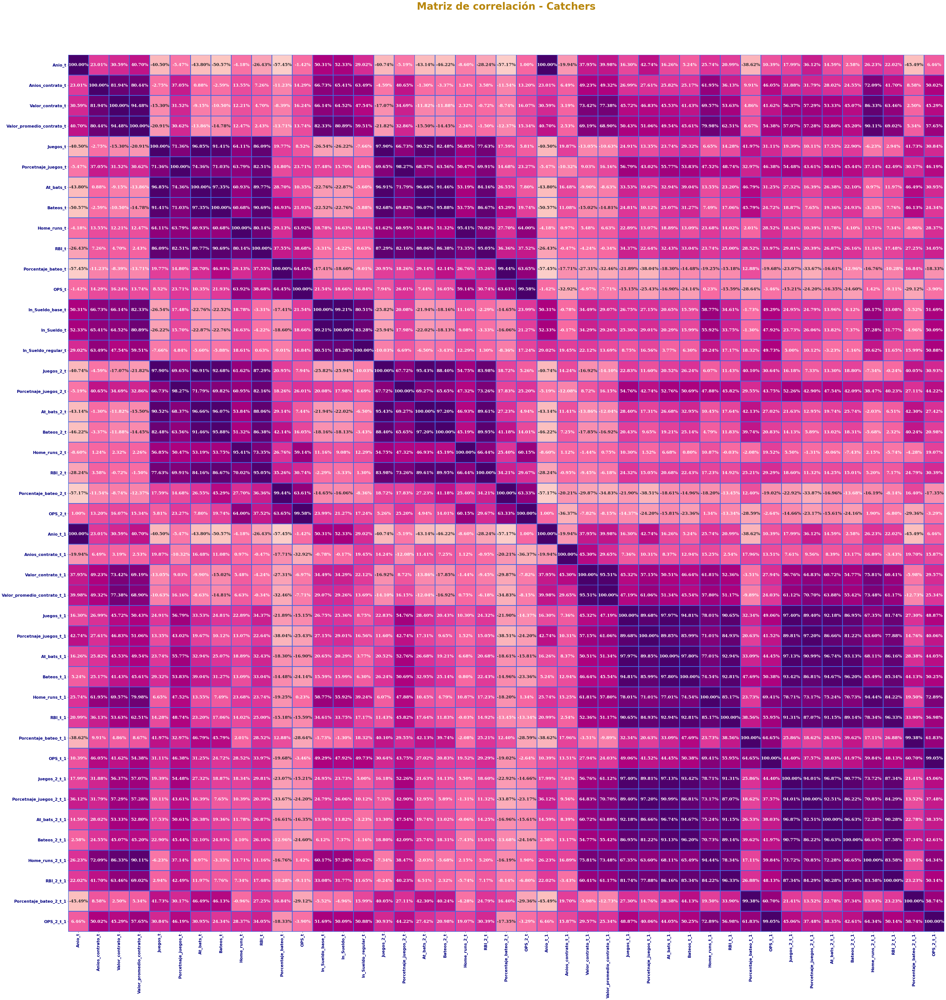

In [50]:
plt.figure(figsize=(65, 65))

g = sns.heatmap(catchers_corr, annot = True, cmap = 'RdPu',
            annot_kws={"size": 17, 'fontweight':'bold', 'fontfamily':'serif'}, 
            cbar_kws={'label': 'Correlación'},
            fmt=".2%", cbar=False, center = 0, square = True,
            linewidth = 2, linecolor = 'royalblue')

plt.title('Matriz de correlación - Catchers', fontsize = 40, 
          fontweight = 'bold', y = 1.05, 
          color = 'darkgoldenrod')
plt.xticks(fontsize = 16, fontweight = 'bold', 
           rotation = 90, color = 'navy')
plt.yticks(fontsize = 16, fontweight = 'bold', 
           rotation = 0, color = 'navy')
plt.savefig(path + "/Visualizations/General statistics/Free Agent/catchers_correlation_matrix.png")
plt.show()

### Relief Pitchers

In [51]:
relief_corr = relief_pitchers_panel_data.corr()

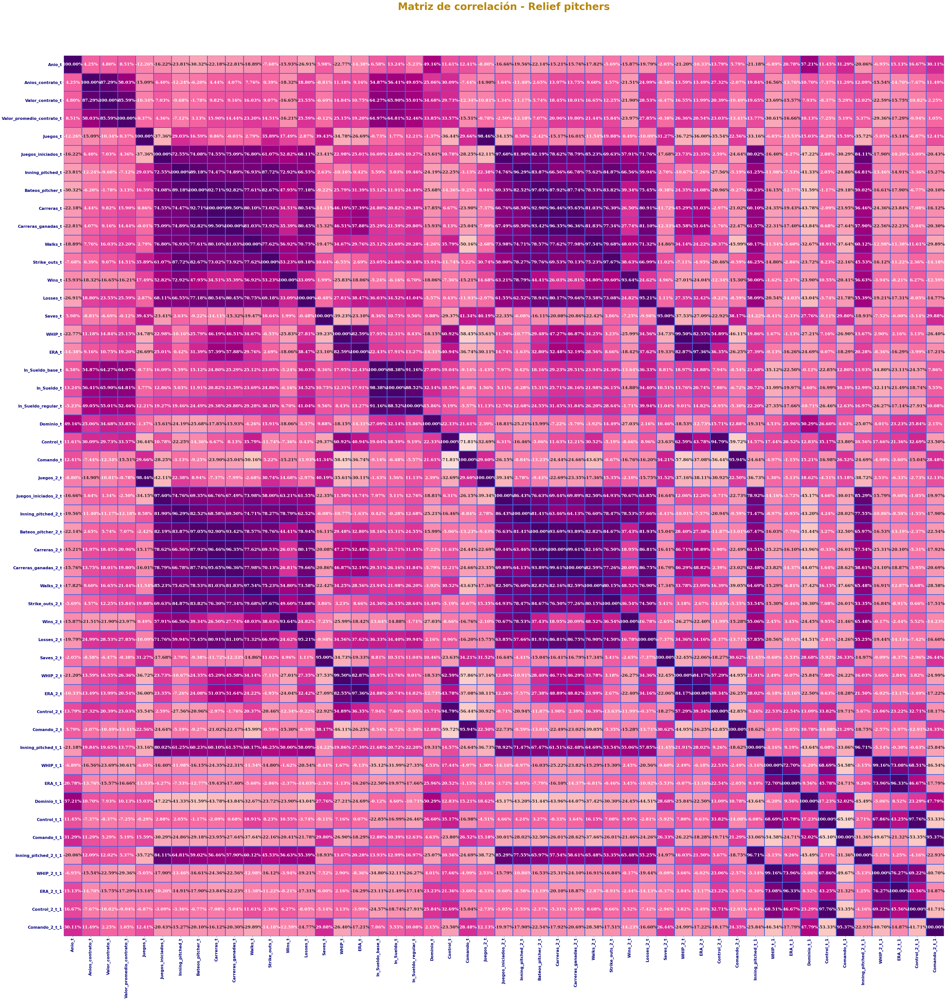

In [52]:
plt.figure(figsize=(65, 65))

g = sns.heatmap(relief_corr, annot = True, cmap = 'RdPu',
            annot_kws={"size": 17, 'fontweight':'bold', 'fontfamily':'serif'}, 
            cbar_kws={'label': 'Correlación'},
            fmt=".2%", cbar=False, center = 0, square = True,
            linewidth = 2, linecolor = 'royalblue')

plt.title('Matriz de correlación - Relief pitchers', fontsize = 40, 
          fontweight = 'bold', y = 1.05, 
          color = 'darkgoldenrod')
plt.xticks(fontsize = 16, fontweight = 'bold', 
           rotation = 90, color = 'navy')
plt.yticks(fontsize = 16, fontweight = 'bold', 
           rotation = 0, color = 'navy')
plt.savefig(path + "/Visualizations/General statistics/Free Agent/relief_pitchers_correlation_matrix.png")
plt.show()

### Starting pitchers

In [53]:
starting_corr = starting_pitchers_panel_data.corr()

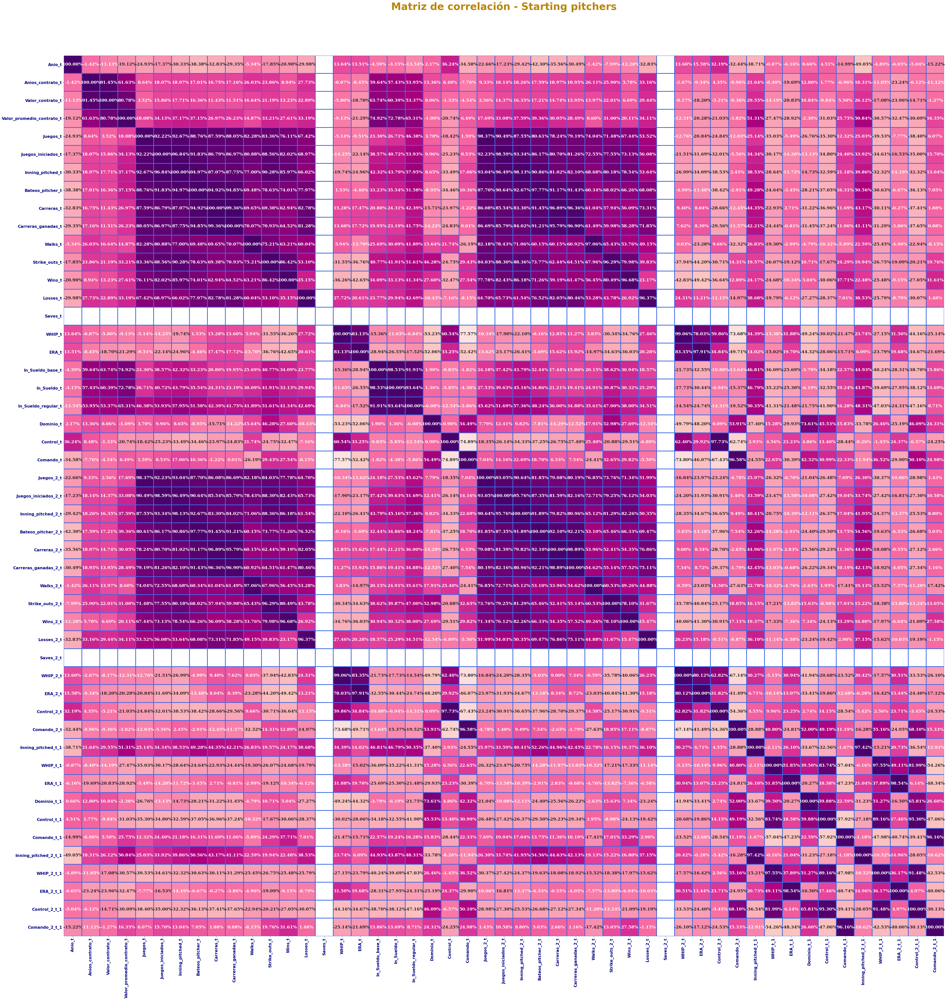

In [57]:
plt.figure(figsize=(65, 65))

g = sns.heatmap(starting_corr, annot = True, cmap = 'RdPu',
            annot_kws={"size": 17, 'fontweight':'bold', 'fontfamily':'serif'}, 
            cbar_kws={'label': 'Correlación'},
            fmt=".2%", cbar=False, center = 0, square = True,
            linewidth = 2, linecolor = 'royalblue')

plt.title('Matriz de correlación - Starting pitchers', fontsize = 40, 
          fontweight = 'bold', y = 1.05, 
          color = 'darkgoldenrod')
plt.xticks(fontsize = 16, fontweight = 'bold', 
           rotation = 90, color = 'navy')
plt.yticks(fontsize = 16, fontweight = 'bold', 
           rotation = 0, color = 'navy')
plt.savefig(path + "/Visualizations/General statistics/Free Agent/starting_pitchers_correlation_matrix.png")
plt.show()

### Remain hitters

In [55]:
remain_corr = remain_hitters_panel_data.corr()

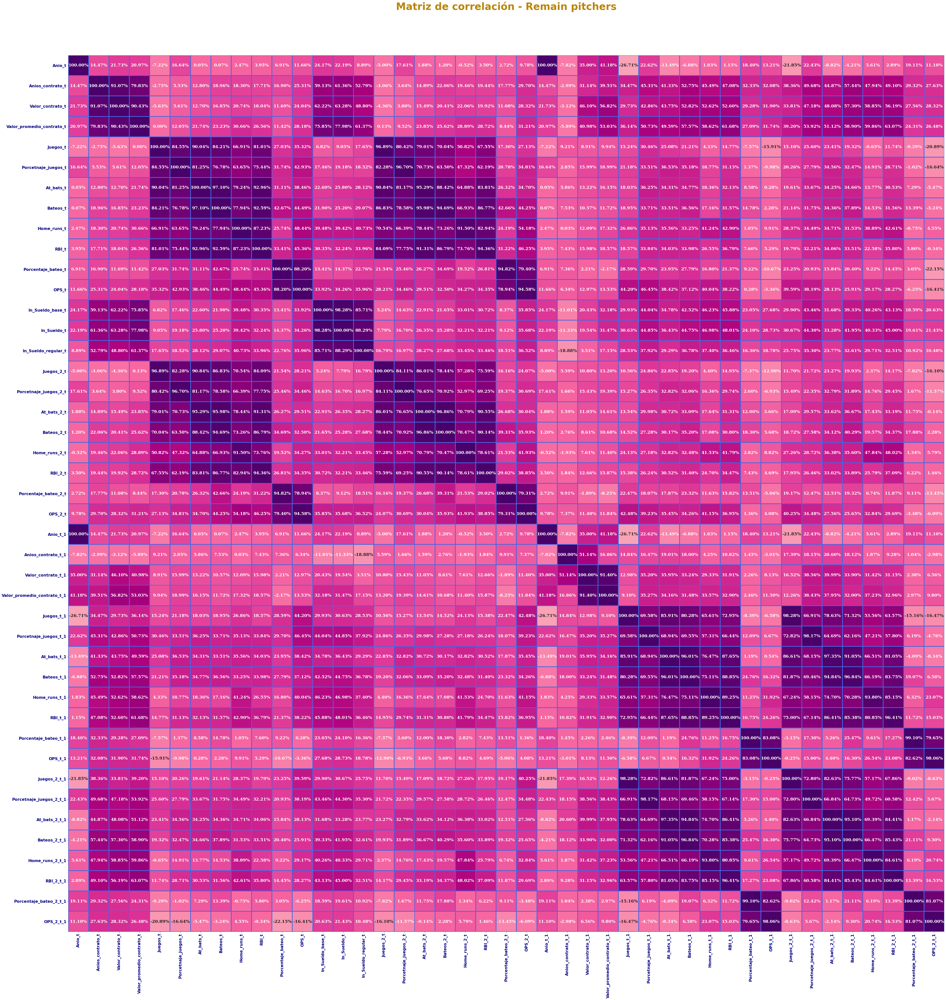

In [56]:
plt.figure(figsize=(65, 65))

g = sns.heatmap(remain_corr, annot = True, cmap = 'RdPu',
            annot_kws={"size": 17, 'fontweight':'bold', 'fontfamily':'serif'}, 
            cbar_kws={'label': 'Correlación'},
            fmt=".2%", cbar=False, center = 0, square = True,
            linewidth = 2, linecolor = 'royalblue')

plt.title('Matriz de correlación - Remain pitchers', fontsize = 40, 
          fontweight = 'bold', y = 1.05, 
          color = 'darkgoldenrod')
plt.xticks(fontsize = 16, fontweight = 'bold', 
           rotation = 90, color = 'navy')
plt.yticks(fontsize = 16, fontweight = 'bold', 
           rotation = 0, color = 'navy')
plt.savefig(path + "/Visualizations/General statistics/Free Agent/remain_hitters_correlation_matrix.png")
plt.show()

Notemos que en el casos de los _hitters_, el $ln(Salario_t)$ tiene la correlación más alta con $(Home\:Runs_{t-1})^{2}$.



# Modelos

Con el criterio de las matrices de correlación construiremos el modelo para $ln(Salario_{t})$

### Catchers